In [1]:
import os, sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import MaaSSim

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
#!pip install MaaSSim
import MaaSSim.utils
import logging
from dotmap import DotMap
import MaaSSim.simulators
from MaaSSim.data_structures import structures as inData
from MaaSSim.day_to_day import driver_opt_out, S_driver_opt_out, traveller_opt_out, S_traveller_opt_out, rh_U_func
from MaaSSim.day_to_day import traveller_opt_out
from MaaSSim.day_to_day import RL_d2d_kpi_veh
from MaaSSim.day_to_day import RL_d2d_kpi_pax

In [4]:
import osmnx as ox
import networkx as nx
import random
import math
import pandas as pd
import matplotlib.pyplot as plt          
import numpy as np
import seaborn as sns
# from statsmodels.tsa.stattools import adfuller

In [5]:
#wazne modyfikacje i dodane funkcjnalnosci w innych miejscach:

#prep_RL_simulate - funkcja sluzaca do przygotowania symulacji
#next_RL_iter - funkcja wykonujaca nastepny dzien symulacji
#RL_d2d_kpi_veh - funkcja dla kpi_veh, taka jak dla d2d_kpi_veh tylko obsluguje marketing w zaleznosci od parametru isMarketingOn
#RL_d2d_kpi_pax - funkcja dla kpi_pax, taka jak dla d2d_kpi_pax tylko obsluguje marketing w zaleznosci od parametru isMarketingOn
#generate_platforms - zmodyfikowane, aby obsługiwało parameter isMarketingOn

In [53]:
def getParams():
    # the setting for TRB results do not delete
    params = MaaSSim.utils.get_config('glance.json')
    params.city = "Delft, Netherlands"
    params.paths.G = "../../data/graphs/Delft.graphml"
    params.paths.skim = "../../data/graphs/Delft.csv"
    params.vehicle_fixed_positions = True
    params.times.patience = 600 #second
    params.dist_threshold = 20000 #meter
    params.dist_threshold_min = 2000 #meter

    params.d2d.probabilistic = True
    params.d2d.heterogeneous = False
    params.d2d.ini_att = 0.5
    params.d2d.B_income = 1
    params.d2d.fuel_cost = 0.25 #euro/km

    # params.d2d.B_inveh_time = 1
    # params.d2d.B_exp_time = 2 #1.5 in oded's paper
    # params.PT_fare = 1 ## euro
    # params.PT_avg_speed = 6
    # params.PT_speed = 6 #my

    params.d2d.B_fare = 2#/14.67 #changed from 1
    params.d2d.B_inveh_time = 1
    params.d2d.B_exp_time = 2 #1.5 in oded's paper
    params.PT_fare = 2 ## euro #changed from 1
    params.PT_speed  = 4 # m/s
    params.PT_avg_speed = 6

    params.nPM = 1 # number of platforms. platform id starts from 1
    params.platforms.base_fare = 1.4 #euro
    params.platforms.fare = float(1.40) #euro/km
    params.platforms.min_fare = float(2) # euro
    params.platforms.comm_rate = float(0.10)
    params.platforms.loc[1].comm_rate = float(0.10)
    params.platforms.discount = float(0.40)
    params.platforms.loc[1].discount = float(0.40)
    params.platforms["isMarketingOn"] = True
    params.platforms.loc[1]["isMarketingOn"] = True

    params.d2d.learning_d = 1 
    params.d2d.B_Experience = 0.8
    params.d2d.B_WOM = 0.18
    params.d2d.B_Marketing = 0.02
    params.d2d.diffusion_speed = 10/100 # speed for M is twice greater than WOM.
    params.d2d.m = 5#8
    params.d2d.Eini_att = 0.01
    params.d2d.adj_s = 2#20
    params.VoT = 10.63 # value of time per hour
    params.assert_me = False
    params.paths.requests = 'Delft_requests.csv'

    params.nP = 50
    params.nV = 5
    params.nD = 100
    params.simTime = 1
    params.d2d.res_wage = params.simTime*10.63 #euro
    return params

In [54]:
# sim = MaaSSim.simulators.simulate(params=params, logger_level=logging.WARNING)
# sim_alter = MaaSSim.simulators.simulate(params=params, f_driver_out=S_driver_opt_out,f_trav_out=S_traveller_opt_out,
#                                   kpi_veh=d2d_kpi_veh,kpi_pax=d2d_kpi_pax, logger_level=logging.WARNING)

# sim = MaaSSim.simulators.simulate(params=params,kpi_pax=d2d_kpi_pax, logger_level=logging.WARNING)

def setSimulation(params, marketingOff=101, discOff=101, greedyOn=101):
    sim = MaaSSim.simulators.prep_RL_simulate(params=params, f_driver_out=S_driver_opt_out,f_trav_out=S_traveller_opt_out,
                                    kpi_veh=RL_d2d_kpi_veh,kpi_pax=RL_d2d_kpi_pax, logger_level=logging.WARNING)
    for i in range(params.nD):
        if i > marketingOff:
            sim.platforms["isMarketingOn"] = False
            sim.platforms.loc[1]["isMarketingOn"] = False
        if i > discOff:
            sim.platforms.discount = float(0.00)
            sim.platforms.loc[1].discount = float(0.00)
            sim.params.discount = float(0.00)
            sim.params.loc[1].discount = float(0.00)
        if i > greedyOn:
            sim.platforms.comm_rate = float(0.70)
            sim.platforms.loc[1].comm_rate = float(0.70)
        sim = MaaSSim.simulators.next_RL_iter(sim, i)
    return sim

This simulation uses albatros data
16-01-23 05:29:25-WARNING-Setting up 1h simulation at 2023-01-16 05:01:25 for 5 vehicles and 50 passengers in Delft, Netherlands
16-01-23 05:29:25-WARNING-simulation time 0.1 s
16-01-23 05:29:26-WARNING-simulation time 0.1 s
16-01-23 05:29:26-WARNING-simulation time 0.1 s
16-01-23 05:29:27-WARNING-simulation time 0.1 s
16-01-23 05:29:27-WARNING-simulation time 0.1 s
16-01-23 05:29:28-WARNING-simulation time 0.1 s
16-01-23 05:29:28-WARNING-simulation time 0.1 s
16-01-23 05:29:29-WARNING-simulation time 0.1 s
16-01-23 05:29:29-WARNING-simulation time 0.1 s
16-01-23 05:29:30-WARNING-simulation time 0.1 s
16-01-23 05:29:30-WARNING-simulation time 0.1 s
16-01-23 05:29:31-WARNING-simulation time 0.1 s
16-01-23 05:29:31-WARNING-simulation time 0.1 s
16-01-23 05:29:31-WARNING-simulation time 0.1 s
16-01-23 05:29:32-WARNING-simulation time 0.1 s
16-01-23 05:29:32-WARNING-simulation time 0.1 s
16-01-23 05:29:33-WARNING-simulation time 0.1 s
16-01-23 05:29:33-WA

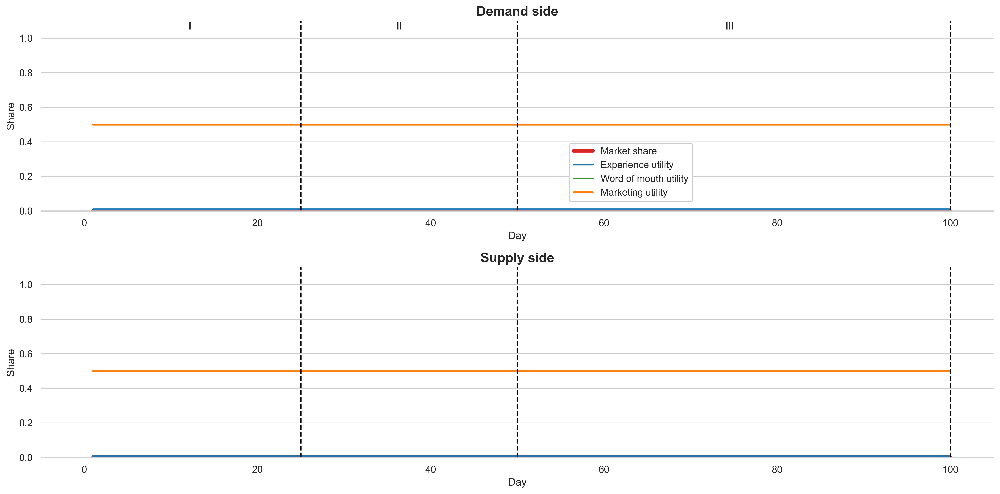

In [57]:
s = setSimulation(getParams(), -1,-1,-1)
printSim(s)
print(getProfit(s, 2))

# s = setSimulation(getParams(), 100, 100, 101)
# printSim(s)
# print(getProfit(s, 2))

# s = setSimulation(getParams(), 100, 100, 101)
# printSim(s)
# print(getProfit(s, 2))

# s = setSimulation(getParams(), 2, -1, 101)
# printSim(s)
# print(getProfit(s, 2))

# s = setSimulation(getParams(), 2, -1, 101)
# printSim(s)
# print(getProfit(s, 2))

# s = setSimulation(getParams(), 2, -1, 101)
# printSim(s)
# print(getProfit(s, 2))

In [51]:
import itertools

results = pd.DataFrame(columns=['marketing', 'discount', 'greedy', 'Market share V', 'Market share P', 'profit', 'sim'])
# inputs = [(2, 101, 25), (25, 101, 25), (50, 101, 25), (2, 101, 50), (25, 101, 50), (50, 101, 50),(2, 101, 75), (25, 101, 75), (50, 101, 75),]
marketings = [1]
discounts = [0, 50]
greedy = [0, 25, 50, 75]

prod = list(itertools.product(marketings, discounts, greedy))

for inp in prod:
    for i in range(3):
        par = getParams()
        sim = setSimulation(par, *inp)
        l = []
        l += inp
        l.append(sim.res[99].veh_exp.OUT.value_counts().get(False, 0)/par.nV)
        l.append(sim.res[99].pax_exp.OUT.value_counts().get(False, 0)/par.nP)
        l.append(getProfit(sim, inp[0]))
        l.append(sim)
        results.loc[len(results)] = l

This simulation uses albatros data
16-01-23 04:18:48-WARNING-Setting up 1h simulation at 2023-01-16 03:49:20 for 5 vehicles and 50 passengers in Delft, Netherlands
16-01-23 04:18:48-WARNING-simulation time 0.1 s
16-01-23 04:18:49-WARNING-simulation time 0.1 s
16-01-23 04:18:49-WARNING-simulation time 0.1 s
16-01-23 04:18:50-WARNING-simulation time 0.1 s
16-01-23 04:18:50-WARNING-simulation time 0.2 s
16-01-23 04:18:51-WARNING-simulation time 0.1 s
16-01-23 04:18:51-WARNING-simulation time 0.1 s
16-01-23 04:18:52-WARNING-simulation time 0.1 s
16-01-23 04:18:52-WARNING-simulation time 0.2 s
16-01-23 04:18:53-WARNING-simulation time 0.2 s
16-01-23 04:18:54-WARNING-simulation time 0.1 s
16-01-23 04:18:54-WARNING-simulation time 0.2 s
16-01-23 04:18:55-WARNING-simulation time 0.1 s
16-01-23 04:18:55-WARNING-simulation time 0.1 s
16-01-23 04:18:56-WARNING-simulation time 0.1 s
16-01-23 04:18:57-WARNING-simulation time 0.2 s
16-01-23 04:18:57-WARNING-simulation time 0.1 s
16-01-23 04:18:58-WA

In [52]:
results[['marketing', 'discount', 'greedy', 'profit']]
# for i in range(4):
#     print(results['discount'][i*5], results['profit'][i*5:i*5+5].mean(), results['Market share P'][i*3:i*3+3].mean(), results['Market share V'][i*5:i*5+5].mean())
# results[['marketing', 'discount', 'greedy', 'profit']].to_csv("parameter_combinations.csv")

,marketing,discount,greedy,profit
0,1,0,0,1090.73754
1,1,0,0,1514.95896
2,1,0,0,1218.93064
3,1,0,25,838.83064
4,1,0,25,954.02250
5,1,0,25,781.47180
6,1,0,50,427.13138
7,1,0,50,1683.52344
8,1,0,50,878.79560
9,1,0,75,970.05544


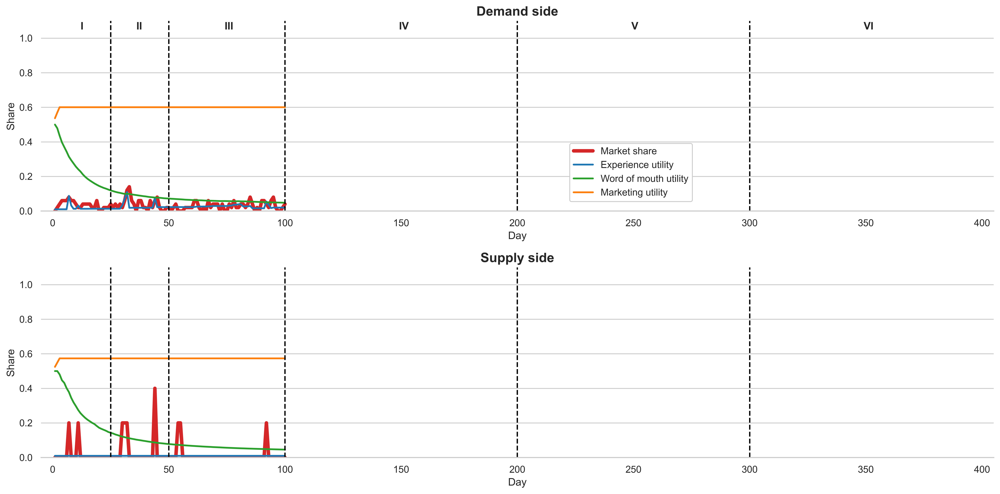

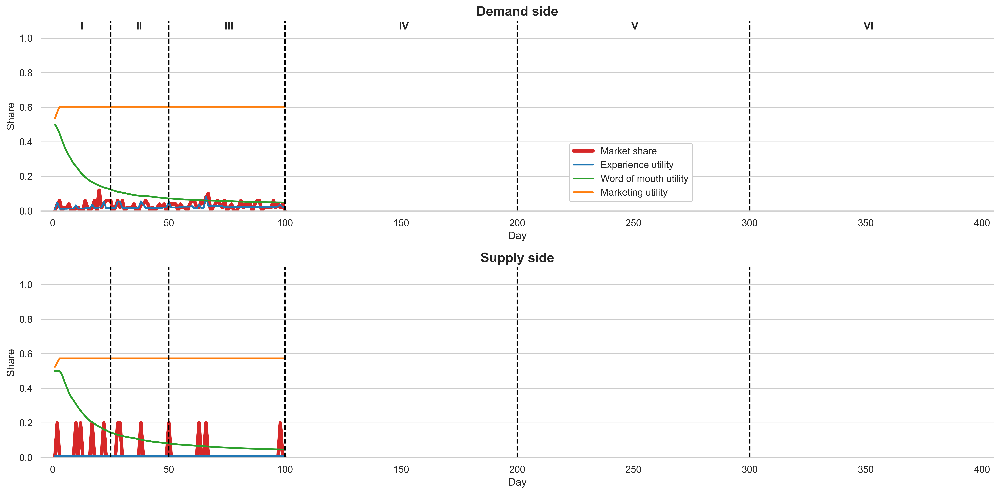

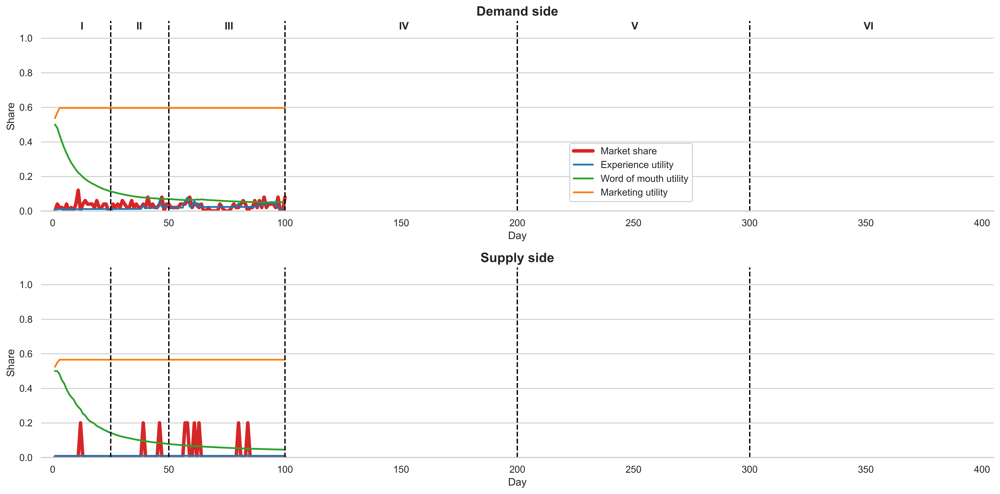

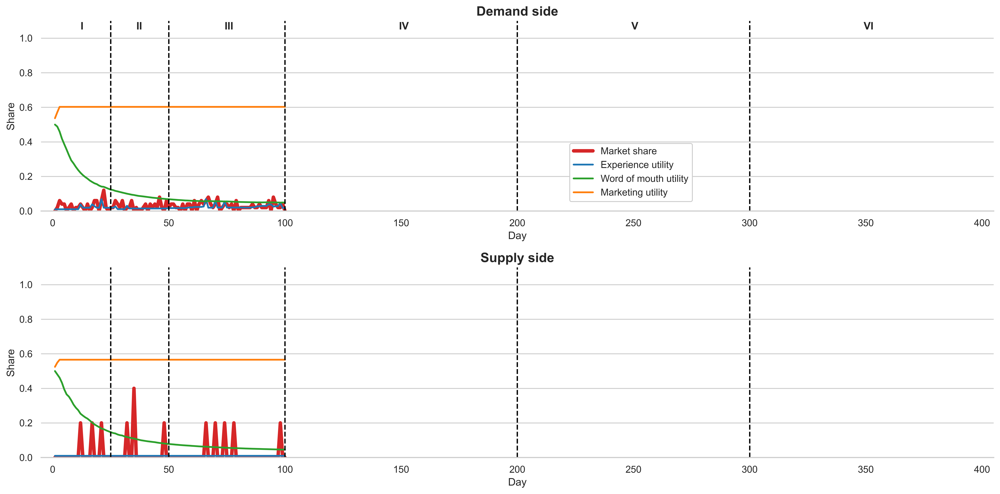

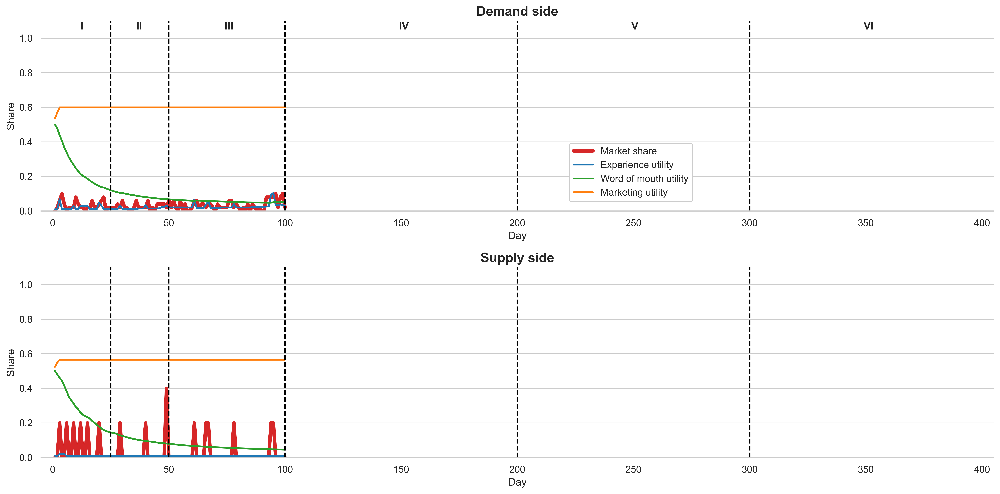

...

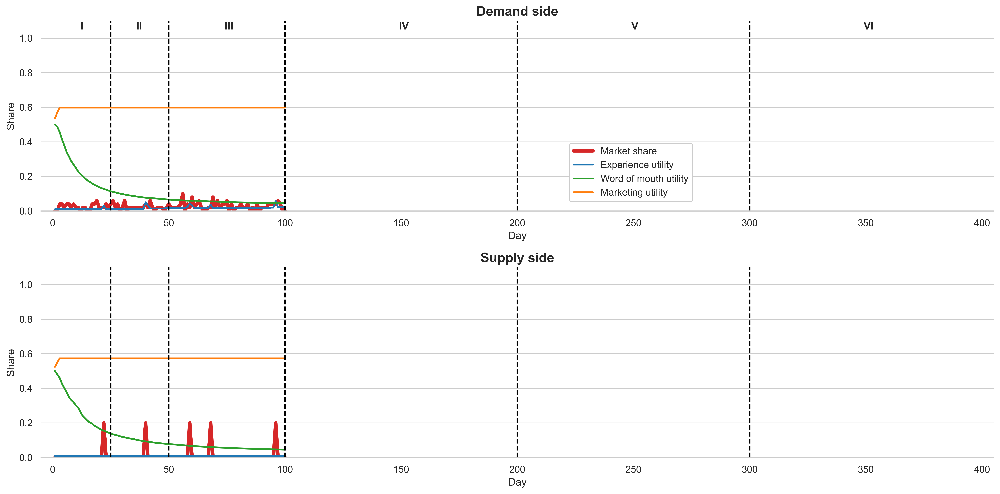

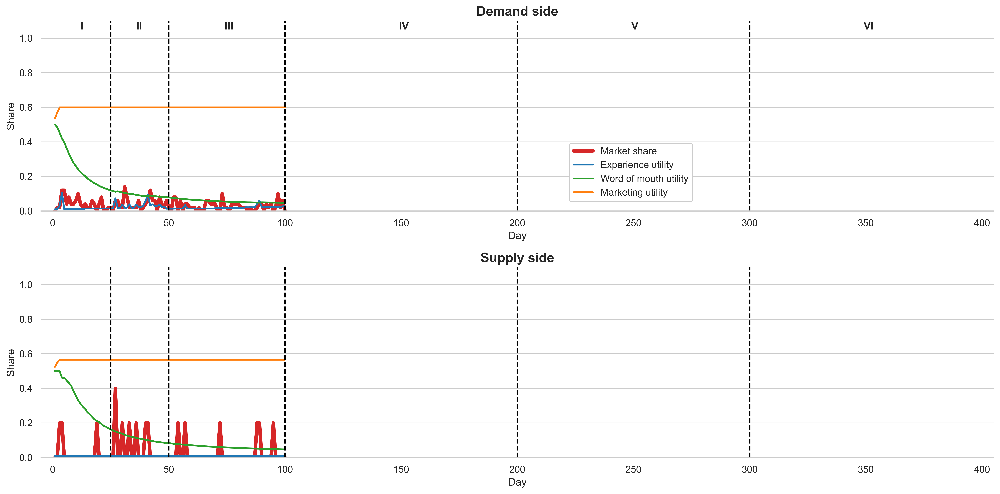

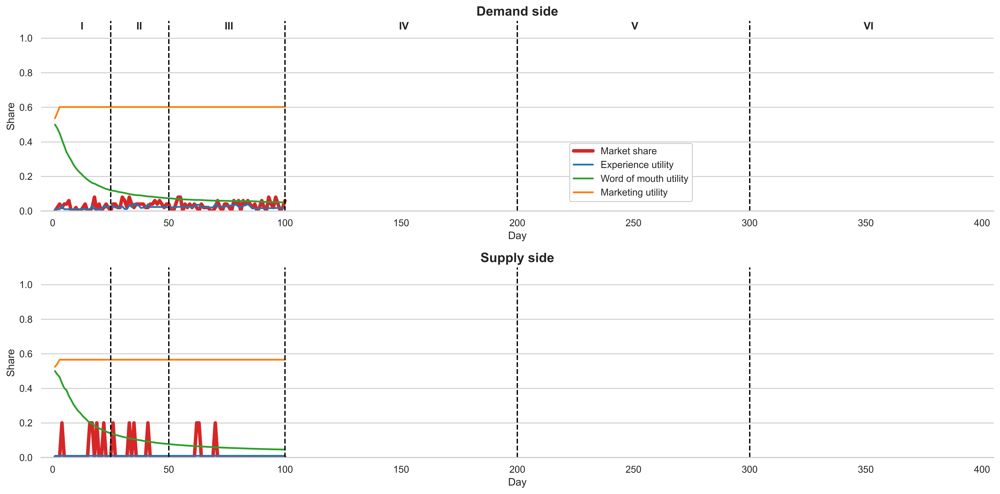

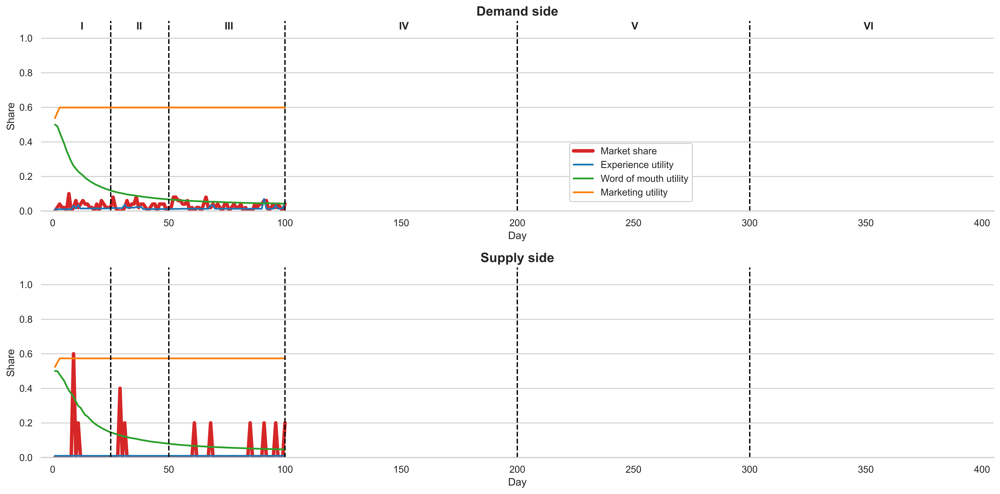

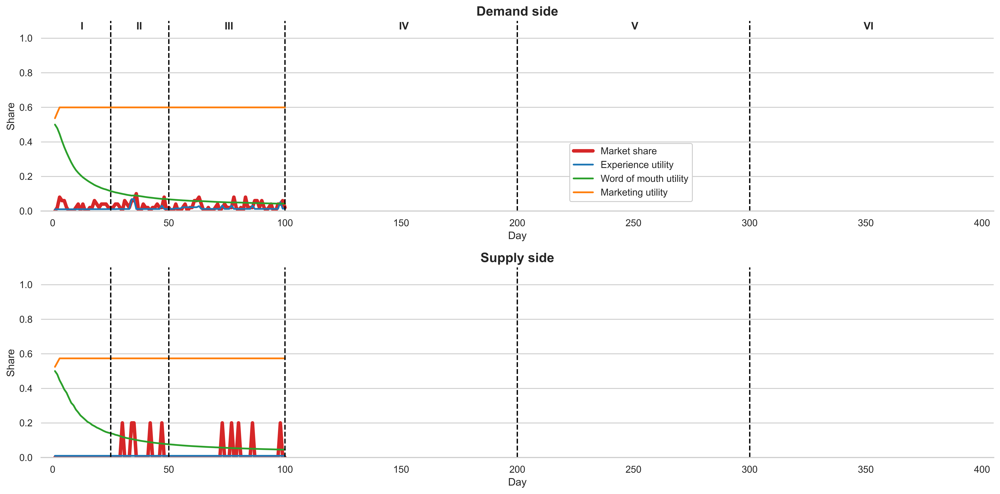

In [38]:
# results = pd.DataFrame(columns=['marketing', 'discount', 'greedy', 'Market share V', 'Market share P', 'profit'])
# results.loc[len(results)] = [1,2,3,4,5,6]

# results
for i in range(20):
    printSim(results.iloc[i]['sim'])

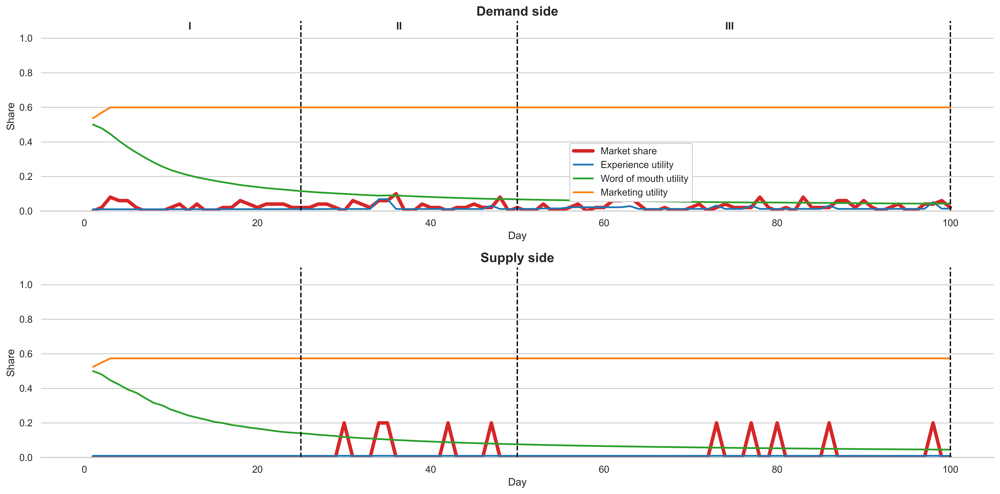

In [44]:
def printSim(sim):
    # with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
    sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
    sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
    sns.set_style('whitegrid')
    fig, ax = plt.subplots(nrows=2, figsize=(16,8))
    # plt.subplots_adjust(wspace=0.3, hspace=0.4)
    sns.despine(left=True)

    params = sim.params

    for ax_n in [0,1]:
        
        x = []; ye = []; ym = []; yw = []; yms = []
        if ax_n==0:
            for d in range(0,sim.params.nD):
                yw.append(sim.res[d].pax_exp.WOM_U.mean())
                ym.append(sim.res[d].pax_exp.MARKETING_U.mean())
                ye.append(sim.res[d].pax_exp.EXPERIENCE_U.mean())
                yms.append(sim.res[d].pax_exp.OUT.value_counts().get(False, 0)/params.nP)
                
        if ax_n==1:
            for d in range(0,sim.params.nD):
                yw.append(sim.res[d].veh_exp.WOM_U.mean())
                ym.append(sim.res[d].veh_exp.MARKETING_U.mean())
                ye.append(sim.res[d].veh_exp.EXPERIENCE_U.mean())
                yms.append(sim.res[d].veh_exp.OUT.value_counts().get(False, 0)/params.nV)
        
        lx = [i for i in range(1,len(ye)+1)]
        sns.lineplot(x=lx, y=yms, label = 'Market share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=ye, label = 'Experience utility', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yw, label = 'Word of mouth utility', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=ym, label = 'Marketing utility', color='C1', lw=2, ax=ax[ax_n])#, marker='o')
    
        ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
        ax[ax_n].grid(axis='x')
        ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,105))
        
    ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
    ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.05))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
    ax[1].get_legend().set_visible(False)
    for i in range(0,6):
        value = ['I','II','III','IV','V','VI']
        coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
        ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

    # plt.yticks([0,1])

    plt.tight_layout()
    # plt.savefig('Fig1.png')

printSim(sim)

In [9]:
def getProfit(sim, marketingOff):
    x = []
    ypr = []

    for d in range(0,sim.params.nD):
        df = sim.res[d].pax_exp
        profit = df[df.OUT==False].plat_profit.sum()
        marketing_costs = 0.5
        if d in range(marketingOff):
            profit -= marketing_costs*(sim.params.nP + sim.params.nV)
        # print(profit)
        ypr.append(profit)
    # x = [i for i in range(1,len(ypr)+1)]
    return sum(ypr)

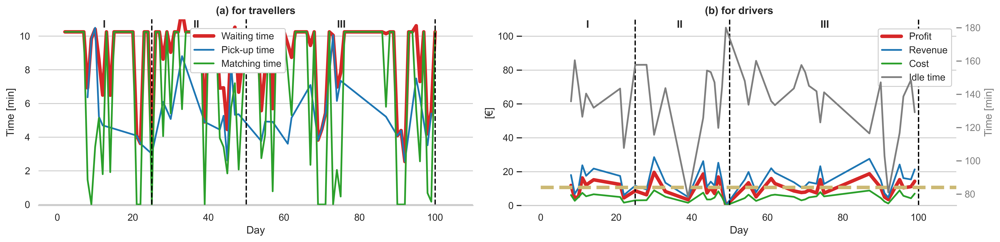

In [32]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(ncols=2, figsize=(16,4))
sns.despine(left=True)
    

x = []
yw = []
yp = []
yi = []
ym = []
yr = []
yprof = []
yc = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    yw.append(df[df.OUT==False].ACTUAL_WT.mean()) # Waiting time per passenger
    ym.append(df[df.OUT==False].MATCHING_T.mean()) # Matching time per passenger
    # yprof.append(df.plat_profit.sum())
    
    df = sim.res[d].veh_exp
    yp.append(df[df.OUT==False].ARRIVES_AT_PICKUP.mean()/(df[df.OUT==False].nRIDES.mean()*60))
    yi.append(df[df.OUT==False].IDLE_TIME.mean()/60)
    yr.append(df[df.OUT==False].REVENUE.mean())
    yprof.append(df[df.OUT==False].ACTUAL_INC.mean())
    yc.append(df[df.OUT==False].COST.mean())



# yw = smooth(yw)
# ym = smooth(ym)
# yp = smooth(yp)
# yi = smooth(yi)
# yr = smooth(yr)
# yprof = smooth(yprof)
# yc = smooth(yc)

x = [i for i in range(1,len(yp)+1)]
sns.lineplot(x=x, y=yw, label = 'Waiting time', color='C3',lw=4, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yp, label = 'Pick-up time', color='C0',lw=2, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'Matching time', color='C2',lw=2, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yprof, label = 'Profit', color='C3',lw=4, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yr, label = 'Revenue', color='C0',lw=2, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yc, label = 'Cost', color='C2',lw=2, ax=ax[1])#, marker='o')ax.twinx()
ax11 = ax[1].twinx()
sns.lineplot(x=x, y=yi, label = 'Idle time', color='C7',lw=2, ax=ax11)#, marker='o')
ax11.set(ylabel='Time [min]')
ax11.grid(b=None)

lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax11.get_legend_handles_labels()
ax[1].legend(lines + lines2, labels + labels2,framealpha=1, loc=(0.82,0.64))
ax11.legend().remove()
# ax11.spines['right'].set_color('C7')
ax11.tick_params(axis='y', colors='C7')
ax11.yaxis.label.set_color('C7')

for i in [0,1]:
    ax[i].grid(axis='x')

ax[0].vlines([25, 50, 100], 0, 11, linestyles='dashed', colors='black')
ax[1].vlines([25, 50, 100], 0, 110, linestyles='dashed', colors='black')
ax[1].hlines([params.d2d.res_wage], 0, 380, linestyles='dashed', colors='y', lw=4)
ax[1].annotate('RW', xy =(385,42), fontweight='bold', color='y')

value = ['I','II','III']
for i in range(0,3):
    coords = [(12,10.5),(36,10.5),(74,10.5)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
for i in range(0,3):
    coords = [(12,105),(36,105),(74,105)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')    
    
ax[0].set(xlabel='Day', ylabel='Time [min]', ylim=(-0.06,11), xlim=(-5,110)); ax[1].set(xlabel='Day', ylabel='[€]', ylim=(0,110),xlim=(-5,110))
ax[0].legend(loc=(0.35,0.713),framealpha=1)
sns.despine(left=True)

ax[0].set_title('(a) for travellers',fontweight='bold')
ax[1].set_title('(b) for drivers',fontweight='bold')

plt.tight_layout()
plt.savefig('Fig3.png')

In [ ]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(ncols=2,figsize=(16,4))
sns.despine(left=True)

x = []
ypkm = []
yvkm = []

for d in range(0,sim.params.nD):
    df = sim.res[d].veh_exp
    df['pkm'] = df.DRIVING_DIST-df.PICKUP_DIST
    ypkm.append(df.pkm.sum())
    yvkm.append(df.DRIVING_DIST.sum())

x = [i for i in range(1,len(ypkm)+1)]

# ypkms = smooth(ypkm)
# yvkms = smooth(yvkm)
sns.lineplot(x=x, y=ypkm, lw=3, label = 'passenger-kilometer', ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yvkm, lw=3, label = 'vehicle-kilometer', color='C1', ax=ax[0])#, marker='o')
lines, labels = ax[0].get_legend_handles_labels()

sns.scatterplot(x=x, y=ypkm, s=10,label = 'passenger-kilometer',ax=ax[0])#, marker='o')
sns.scatterplot(x=x, y=yvkm, s=10,label = 'vehicle-kilometer', color='C1',ax=ax[0])#, marker='o')

ax[0].set(ylim=(-10,8500), xlim=(-5,110), xlabel='Day', ylabel='Distance [km]')
ax[0].legend(lines, labels ,framealpha=1, loc=(0.43,0.05))
ax[0].grid(axis='x')
ax[0].vlines([25, 50, 100], 0, 8500, linestyles='dashed', colors='black')

value = ['I','II','III']
for i in range(0,3):
    coords = [(12,8250),(36,8250),(74,8250),(149,8250),(249,8250),(349,8250)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
#-----------------------------------------------------------------------------------
x = []
ypr = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    ypr.append(df[df.OUT==False].plat_profit.sum())
x = [i for i in range(1,len(ypr)+1)]

df = pd.Series(ypr).to_frame()
df.columns = ['income']
marketing_costs = 0.5
df['marketing costs']=df.apply(lambda x: -marketing_costs*55 if x.name >50 and x.name<=100 else 0, axis = 1).astype(int)
df['profit']=df.income + df['marketing costs']

sns.lineplot(x=x, y=df.income.cumsum(), lw=3, label = 'Cumulative revenue', color='C0',ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=df.profit.cumsum(), lw=3, label = 'Cumulative profit', color='C8',ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=df['marketing costs'].astype(int).cumsum(), lw=3, label = 'Cumulative cost', color='C1',ax=ax[1])#, marker='o')

ax[1].grid(axis='x')
ax[1].vlines([25, 50, 100, 200, 300], -100000, 325000, linestyles='dashed', colors='black')
# sns.lineplot(x=x, y=ypr, label = 'plat_profit')#, marker='o')
sns.despine(left=True)
ax[1].set(xlim=(-5,110), ylim=(-100000,325000), xlabel='Day', ylabel='Loss and gains [€]')
ax[1].legend(framealpha=1, loc=(0.43,0.7))

value = ['I','II','III']
for i in range(0,3):
    coords = [(12,312500),(36,312500),(74,312500),(149,312500),(249,312500),(349,312500)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')
    

ax[0].set_title('(a)',fontweight='bold')
ax[1].set_title('(b)',fontweight='bold')


plt.tight_layout()
plt.savefig('Fig4.png')

In [81]:
sim.res[90].pax_exp[['rh_U', 'alt_U', 'U_dif', 'EXPERIENCE_U']]

,rh_U,alt_U,U_dif,EXPERIENCE_U
pax,,,,
0,-19.414154,-21.173396,-0.083087,0.104310
1,-11.670592,-20.069375,-0.418488,0.982900
2,-4.325283,-14.093708,0.000000,0.023923
3,-14.571352,-11.376750,0.280801,0.076029
4,-16.104349,-14.483604,0.111902,0.044327
5,-3.571097,-11.040208,0.000000,0.053707
6,-15.728769,-13.716125,0.146736,0.126385
7,-2.931472,-8.454583,0.000000,0.010000
8,-9.166492,-21.321146,0.000000,0.800038


In [183]:
for i in [1, 10, 30, 50, 70, 90]:
    print(sim.res[i].veh_exp[['nRIDES', 'REVENUE', 'ACTUAL_INC', 'INFORMED', 'EXPERIENCE_U', 'MARKETING_U', 'WOM_U']])

sim.res[90].veh_exp.keys()

     nRIDES  REVENUE  ACTUAL_INC INFORMED  EXPERIENCE_U  MARKETING_U     WOM_U
veh                                                                           
1       0.0   0.0000      0.0000     True          0.01     0.500000  0.403825
2       0.0   0.0000      0.0000    False          0.01     0.500000  0.500000
3       3.0  14.6124      9.3224     True          0.01     0.622459  0.403236
4       0.0   0.0000      0.0000    False          0.01     0.500000  0.500000
5       0.0   0.0000      0.0000     True          0.01     0.622459  0.500000
     nRIDES  REVENUE  ACTUAL_INC INFORMED  EXPERIENCE_U  MARKETING_U     WOM_U
veh                                                                           
1       0.0      0.0         0.0     True      0.051300     0.706312  0.279780
2       0.0      0.0         0.0     True      0.014251     0.763367  0.401472
3       0.0      0.0         0.0     True      0.010000     0.706312  0.236471
4       0.0      0.0         0.0     True      0.035

Index(['nRIDES', 'nREJECTED', 'nDAYS_WORKED', 'DRIVING_TIME', 'IDLE_TIME',
       'PICKUP_DIST', 'DRIVING_DIST', 'REVENUE', 'COST', 'COMMISSION',
       'TRIP_FARE', 'ACTUAL_INC', 'OUT', 'mu', 'INFORMED', 'EXPERIENCE_U',
       'MARKETING_U', 'WOM_U', 'STARTS_DAY', 'OPENS_APP', 'RECEIVES_REQUEST',
       'ACCEPTS_REQUEST', 'REJECTS_REQUEST', 'IS_ACCEPTED_BY_TRAVELLER',
       'IS_REJECTED_BY_TRAVELLER', 'ARRIVES_AT_PICKUP',
       'MEETS_TRAVELLER_AT_PICKUP', 'DEPARTS_FROM_PICKUP',
       'ARRIVES_AT_DROPOFF', 'CONTINUES_SHIFT', 'STARTS_REPOSITIONING',
       'REPOSITIONED', 'DECIDES_NOT_TO_DRIVE', 'ENDS_SHIFT'],
      dtype='object')

<AxesSubplot: >

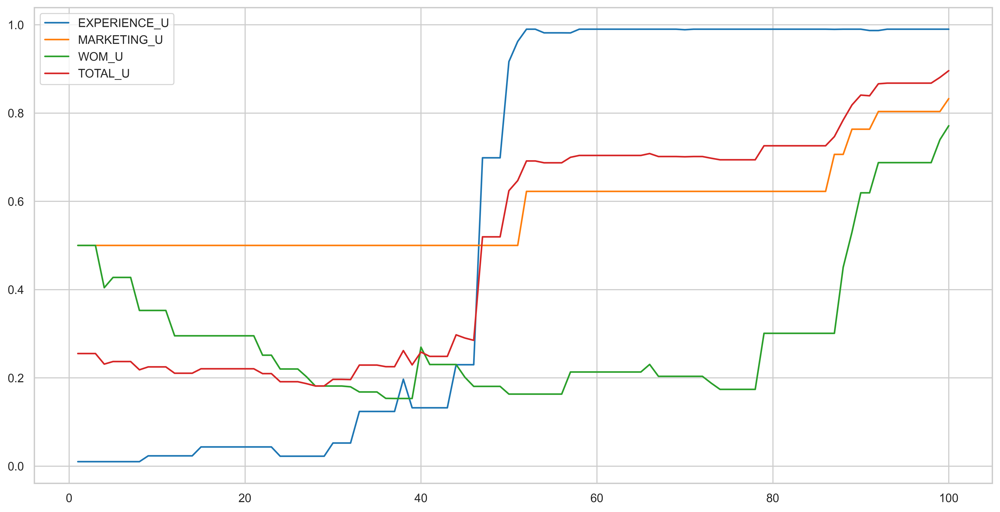

In [14]:
fig, ax = plt.subplots(figsize=(16,8))

veh_id = 4
x = []
ye = []
ym = []
yw = []
yu = []

for d in range(0,sim.params.nD):
    ye.append(sim.res[d].veh_exp.loc[veh_id].EXPERIENCE_U)
    ym.append(sim.res[d].veh_exp.loc[veh_id].MARKETING_U)
    yw.append(sim.res[d].veh_exp.loc[veh_id].WOM_U)
    yu.append((0.5*ye[-1])+(0.25*ym[-1])+(0.25*yw[-1]))
    
x = [i for i in range(1,len(ye)+1)]
sns.lineplot(x=x, y=ye, label = 'EXPERIENCE_U')#, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'MARKETING_U')#, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yw, label = 'WOM_U')#, ax=ax[2])#, marker='o')
sns.lineplot(x=x, y=yu, label = 'TOTAL_U')#, ax=ax[3])#, marker='o')

In [52]:
veh_id = 1
for d in range(0,sim.params.nD):
    print(sim.res[d].veh_exp.loc[veh_id].nRIDES,
        sim.res[d].veh_exp.loc[veh_id].nRIDES,
        sim.res[d].veh_exp.loc[veh_id].REVENUE,
        sim.res[d].veh_exp.loc[veh_id].ACTUAL_INC,
        sim.res[d].veh_exp.loc[veh_id].nDAYS_WORKED,
        sim.res[d].veh_exp.loc[veh_id].INFORMED,
        params.d2d.res_wage)
    # print(sim.res[d].veh_exp.loc[1].nDAYS_WORKED, sim.res[d].veh_exp.loc[2].nDAYS_WORKED, sim.res[d].veh_exp.loc[3].nDAYS_WORKED, sim.res[d].veh_exp.loc[4].nDAYS_WORKED)

print(sim.res[3].veh_exp.loc[veh_id].keys())

0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.0 0.0 0 False 21.26
0.0 0.0 0.

In [110]:
import itertools
import matplotlib
import matplotlib.style
import numpy as np
import pandas as pd
import sys
  
  
from collections import defaultdict
# import plotting
  
matplotlib.style.use('ggplot')

In [11]:
# 100 iteracji 100-dniowych symulacji
# uzyty algorytm: q-learning
# epsilon spada w dol: najpierw bardziej eksplorujemy, pozniej bardziej eksploitujemy
# stan: krotka (dzien, zarobek wczoraj - bez odjecia kosztu marketingu, czy wlaczony marketing, czy wlaczony tryb discount, czy wlaczony tryb greedy)
# akcje: 8 akcji - kombinacja 3 akcji true/false: 1. czy wlaczony marketing, czy wlaczony tryb discount, czy wlaczony tryb greedy
# rezultat: algorytm sie nauczyl zeby zawsze wykonywac akcje 0: (false, false, false)
# marketing wydaje sie za drogi na taka symulacje (ustawiony na 0.10$ na osobe)

In [111]:
class UberEnv:
    def __init__(self) -> None:
        self.action_space = DotMap({})
        self.action_space['n'] = 2**3

    def reset(self):
        # # the setting for TRB results do not delete
        # params = MaaSSim.utils.get_config('glance.json')
        # params.city = "Delft, Netherlands"
        # params.paths.G = "../../data/graphs/Delft.graphml"
        # params.paths.skim = "../../data/graphs/Delft.csv"
        # params.vehicle_fixed_positions = True
        # params.times.patience = 600 #second
        # params.dist_threshold = 20000 #meter
        # params.dist_threshold_min = 2000 #meter

        # params.d2d.probabilistic = True
        # params.d2d.heterogeneous = False
        # params.d2d.ini_att = 0.5
        # params.d2d.B_income = 1
        # params.d2d.fuel_cost = 0.25 #euro/km

        # # params.d2d.B_inveh_time = 1
        # # params.d2d.B_exp_time = 2 #1.5 in oded's paper
        # # params.PT_fare = 1 ## euro
        # # params.PT_avg_speed = 6
        # # params.PT_speed = 6 #my

        # params.d2d.B_fare = 1.8#/14.67 #changed from 1
        # params.d2d.B_inveh_time = 1
        # params.d2d.B_exp_time = 2 #1.5 in oded's paper
        # params.PT_fare = 2 ## euro #changed from 1
        # params.PT_speed  = 4 # m/s
        # params.PT_avg_speed = 6

        # params.nPM = 1 # number of platforms. platform id starts from 1
        # params.platforms.base_fare = 1.4 #euro
        # params.platforms.fare = float(1.20) #euro/km
        # params.platforms.min_fare = float(2) # euro
        # params.platforms.comm_rate = float(0.10)
        # params.platforms.loc[1].comm_rate = float(0.10)
        # params.platforms.discount = float(0.40)
        # params.platforms["isMarketingOn"] = True
        # params.platforms.loc[1]["isMarketingOn"] = True

        # params.d2d.learning_d = 1 
        # params.d2d.B_Experience = 0.8
        # params.d2d.B_WOM = 0.18
        # params.d2d.B_Marketing = 0.02
        # params.d2d.diffusion_speed = 30/100 # speed for M is twice greater than WOM.
        # params.d2d.m = 5
        # params.d2d.Eini_att = 0.01
        # params.d2d.adj_s = 2
        # params.VoT = 10.63 # value of time per hour
        # params.assert_me = False
        # params.paths.requests = 'Delft_requests.csv'

        # params.nP = 50
        # params.nV = 5
        # params.nD = 100
        # params.simTime = 1
        # params.d2d.res_wage = params.simTime*10.63 #euro

        params = getParams()
        sim = MaaSSim.simulators.prep_RL_simulate(params=params, f_driver_out=S_driver_opt_out,f_trav_out=S_traveller_opt_out,
                                  kpi_veh=RL_d2d_kpi_veh,kpi_pax=RL_d2d_kpi_pax, logger_level=logging.WARNING)
        self.sim = sim
        self.day = 0
        # self.state = (0, 0)

        return (0, 0, True, False, False)

    def step(self, action):
        isMarketingOn = bool((action >> 2) % 2)
        discounted = bool((action >> 1) % 2)
        greedy = bool((action >> 0) % 2)
        # print( self.sim.params.platforms.isMarketingOn, self.sim.params.platforms.discount, self.sim.params.platforms.comm_rate)
        # print(action, isMarketingOn, discounted, greedy)
        self.sim.platforms.isMarketingOn = isMarketingOn
        self.sim.platforms.discount = float(0.40) if discounted else float(0.00)
        self.sim.params.platforms.discount = float(0.40) if discounted else float(0.00)
        self.sim.platforms.comm_rate = float(0.70) if greedy else float(0.10)

        self.sim.platforms.loc[1].isMarketingOn = isMarketingOn
        self.sim.platforms.loc[1].discount = float(0.40) if discounted else float(0.00)
        self.sim.params.platforms.loc[1].discount = float(0.40) if discounted else float(0.00)
        self.sim.platforms.loc[1].comm_rate = float(0.70) if greedy else float(0.10)

        self.sim = MaaSSim.simulators.next_RL_iter(self.sim, self.day)

        df = self.sim.res[self.day].pax_exp
        last_day_rev = df[df.OUT==False].plat_profit.sum()
        marketing_costs = 0.5
        last_day_profit = last_day_rev
        if isMarketingOn:
            last_day_profit -= (marketing_costs*(self.sim.params.nP + self.sim.params.nV))

        self.day += 1
        return(self.day, last_day_rev, isMarketingOn, discounted, greedy), last_day_profit, (self.day == self.sim.params.nD), True



env = UberEnv()

bool((4 >> 2) % 2)

True

In [112]:
def createEpsilonGreedyPolicy(Q, num_actions):
    """
    Creates an epsilon-greedy policy based
    on a given Q-function and epsilon.
       
    Returns a function that takes the state
    as an input and returns the probabilities
    for each action in the form of a numpy array 
    of length of the action space(set of possible actions).
    """
    def policyFunction(state, epsilon):

        
   
        Action_probabilities = np.ones(num_actions,
                dtype = float) * epsilon / num_actions
                  
        best_action = np.argmax(Q[state])
        Action_probabilities[best_action] += (1.0 - epsilon)
        return Action_probabilities
   
    return policyFunction

In [113]:
def qLearning(env, num_episodes, discount_factor = 1.0,
                            alpha = 0.6, epsilon = 0.1):
    """
    Q-Learning algorithm: Off-policy TD control.
    Finds the optimal greedy policy while improving
    following an epsilon-greedy policy"""
       
    # Action value function
    # A nested dictionary that maps
    # state -> (action -> action-value).
    Q = defaultdict(lambda: np.zeros(env.action_space.n))
   
    # Keeps track of useful statistics
    # stats = plotting.EpisodeStats(
    #     episode_lengths = np.zeros(num_episodes),
    #     episode_rewards = np.zeros(num_episodes))
    stats = None
    eps = 1.0   
       
    # Create an epsilon greedy policy function
    # appropriately for environment action space
    policy = createEpsilonGreedyPolicy(Q, env.action_space.n)
       
    # For every episode
    for ith_episode in range(num_episodes):
           
        # Reset the environment and pick the first action
        state = env.reset()
           
        for t in itertools.count():
               
            # get probabilities of all actions from current state
            action_probabilities = policy(state, eps)
   
            # choose action according to 
            # the probability distribution
            action = np.random.choice(np.arange(
                      len(action_probabilities)),
                       p = action_probabilities)

            isMarketingOn = state[2]
            while (not isMarketingOn) and bool((action >> 2) % 2):
                action = np.random.choice(np.arange(
                      len(action_probabilities)),
                       p = action_probabilities)
   
            # take action and get reward, transit to next state
            next_state, reward, done, _ = env.step(action)
   
            # Update statistics
            # stats.episode_rewards[ith_episode] += reward
            # stats.episode_lengths[ith_episode] = t
               
            # TD Update
            best_next_action = np.argmax(Q[next_state])    
            td_target = reward + discount_factor * Q[next_state][best_next_action]
            td_delta = td_target - Q[state][action]
            Q[state][action] += alpha * td_delta
   
            # done is True if episode terminated   
            if done:
                break
                   
            state = next_state

        eps *= 0.995
       
    return Q, stats

In [114]:
Q, stats = qLearning(env, 500)

This simulation uses albatros data
15-01-23 06:09:26-WARNING-Setting up 1h simulation at 2023-01-15 05:40:32 for 5 vehicles and 50 passengers in Delft, Netherlands
15-01-23 06:09:27-WARNING-simulation time 0.1 s
15-01-23 06:09:27-WARNING-simulation time 0.1 s
15-01-23 06:09:28-WARNING-simulation time 0.1 s
15-01-23 06:09:28-WARNING-simulation time 0.1 s
15-01-23 06:09:29-WARNING-simulation time 0.1 s
15-01-23 06:09:29-WARNING-simulation time 0.1 s
15-01-23 06:09:29-WARNING-simulation time 0.1 s
15-01-23 06:09:30-WARNING-simulation time 0.1 s
15-01-23 06:09:30-WARNING-simulation time 0.1 s
15-01-23 06:09:31-WARNING-simulation time 0.1 s
15-01-23 06:09:31-WARNING-simulation time 0.1 s
15-01-23 06:09:32-WARNING-simulation time 0.1 s
15-01-23 06:09:32-WARNING-simulation time 0.1 s
15-01-23 06:09:33-WARNING-simulation time 0.1 s
15-01-23 06:09:33-WARNING-simulation time 0.1 s
15-01-23 06:09:34-WARNING-simulation time 0.1 s
15-01-23 06:09:34-WARNING-simulation time 0.1 s
15-01-23 06:09:35-WA

In [16]:
plotting.plot_episode_stats(stats)

NameError: name 'plotting' is not defined

In [115]:
Q

defaultdict(<function __main__.qLearning.<locals>.<lambda>()>,
            {(0,
              0,
              True,
              False,
              False): array([  7.13182627,   6.12501058,   7.62921762,   8.45338388,
                    -21.86502591, -20.23432918, -19.9702972 , -16.93474679]),
             (1,
              0.0,
              True,
              False,
              False): array([  0.        ,   9.06216723,  -2.624688  ,   1.37412   ,
                    -15.780336  , -14.133384  ,   0.        , -19.775976  ]),
             (2,
              2.2901999999999996,
              False,
              True,
              True): array([0.      , 6.453216, 0.      , 0.83304 , 0.      , 0.      ,
                    0.      , 0.      ]),
             (3,
              10.75536,
              False,
              False,
              True): array([0.      , 1.985088, 0.      , 0.      , 0.      , 0.      ,
                    0.      , 0.      ]),
             (4,
       

In [118]:

eps = 0 ## test Q table
policy = createEpsilonGreedyPolicy(Q, env.action_space.n)
state = env.reset()
        
for t in itertools.count():         
    # get probabilities of all actions from current state
    action_probabilities = policy(state, eps)
    print(env.day, action_probabilities)

    # choose action according to 
    # the probability distribution
    action = np.random.choice(np.arange(
                len(action_probabilities)),
                p = action_probabilities)

    # take action and get reward, transit to next state
    next_state, reward, done, _ = env.step(action)

    # done is True if episode terminated
    if done:
        break
            
    state = next_state
    print(state)

This simulation uses albatros data
15-01-23 14:14:16-WARNING-Setting up 1h simulation at 2023-01-15 13:46:44 for 5 vehicles and 50 passengers in Delft, Netherlands
0 [0. 0. 0. 1. 0. 0. 0. 0.]
15-01-23 14:14:17-WARNING-simulation time 0.1 s
(1, 0.0, False, True, True)
1 [0. 0. 0. 1. 0. 0. 0. 0.]
15-01-23 14:14:17-WARNING-simulation time 0.1 s
(2, 0.0, False, True, True)
2 [0. 0. 1. 0. 0. 0. 0. 0.]
15-01-23 14:14:18-WARNING-simulation time 0.1 s
(3, 0.0, False, True, False)
3 [0. 0. 1. 0. 0. 0. 0. 0.]
15-01-23 14:14:18-WARNING-simulation time 0.1 s
(4, 0.0, False, True, False)
4 [1. 0. 0. 0. 0. 0. 0. 0.]
15-01-23 14:14:19-WARNING-simulation time 0.1 s
(5, 0.0, False, False, False)
5 [0. 1. 0. 0. 0. 0. 0. 0.]
15-01-23 14:14:19-WARNING-simulation time 0.1 s
(6, 0.0, False, False, True)
6 [0. 0. 1. 0. 0. 0. 0. 0.]
15-01-23 14:14:20-WARNING-simulation time 0.1 s
(7, 0.0, False, True, False)
7 [0. 1. 0. 0. 0. 0. 0. 0.]
15-01-23 14:14:20-WARNING-simulation time 0.1 s
(8, 0.0, False, False, Tru

In [48]:
printSim(env.sim)
getProfit(env.sim, -1)

NameError: name 'env' is not defined